# Project objectives

The project had three primary goals:

1. Collect climate data from the capital cities of Spain between 1963 and 2022.
2. Analyze the collected weather dataset.
3. Identify changes in weather patterns that could indicate global warming or other types of climate change.


<a name="top"></a>
 
## Table of Contents 
* [1. Data collection and preprocessing](#item1)
    * [1.1. Information about the capitals of Spain](#item1.1)
        * [1.1.1. Data collection](#item1.1.1)
    * [1.2. Climate of the capitals of Spain from 1963 to 2022](#item1.2)
        * [1.2.1. Data collection](#item2.1.1)
        * [1.2.1. Data preprocessing](#item2.1.2)
* [2. Data analysis](#item2)
    * [2.1. Annual climate anomaly](#item2.1)
        * [2.1.1. Basemap animation about annual climate anomaly](#item2.1.1)
            * [2.1.1.1. Folium map](#item2.1.1.1)
            * [2.1.1.2. Web scraping](#item2.1.1.2)
        * [2.1.2. Bar chart about annual temperature anomaly](#item2.1.2)
        * [2.1.3. Top 10 anomalies](#item2.1.3)
    * [2.2. Monthly temperature anomaly](#item2.2)
        * [2.2.1. Animation about monthly climate anomaly](#item2.2.1)
        * [2.2.2. Bar and line chart monthly temperature anomaly](#item2.2.2)
        * [2.2.3. Highest anomaly for each month](#item2.2.3)
* [3. Conclution](#item3)

In [1]:
import pandas as pd
import numpy as np
import requests
from pprint import pprint
from time import sleep
import plotly.express as px
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from selenium import webdriver
import os
import folium
import imageio
from PIL import Image
from webdriver_manager.chrome import ChromeDriverManager
import time

<a name="item1"></a>
# 1. Data collection and  preprocessing
<a name="item1.1"></a>
## 1.1. Information about the capitals of Spain
<a name="item1.1.1"></a>
### 1.1.1. Data collection

The data for the capitals of Spain are extracted from Opendatasoft.

For this project, the following data for each capital is used:

- Name of the capital city 
- Autonomous Community
- Latitude and longitude

In [2]:
def Datos_geograficos():
    endpoint="https://public.opendatasoft.com/api/records/1.0/search/?dataset=provincias-espanolas&q=&rows=52&sort=provincia&facet=ccaa&facet=provincia"
    response = requests.get(url=endpoint)
    
    Ciudad=list()
    Ccaa=list() 
    Lat=list()
    Long=list()

    for item in response.json()["records"]:

        ciudad = item["fields"]["texto"]
        ccaa = item["fields"]["ccaa"]
        lat = item["fields"]["geo_point_2d"][0]
        lon = item["fields"]["geo_point_2d"][1]

        Ciudad.append(ciudad)
        Ccaa.append(ccaa)
        Lat.append(lat)
        Long.append(lon)

    df = pd.DataFrame()
    df["Capital City"]=Ciudad
    df["Autonomous Community"]=Ccaa
    df["Latitude"]=Lat
    df["Longitude"]=Long
    df["Latitude"] = df["Latitude"].apply(lambda x : round(x,2)).values
    df["Longitude"] = df["Longitude"].apply(lambda x : round(x,2)).values
    
    return df

In [3]:
df_prov = Datos_geograficos()

In [4]:
df_prov.head()

,Capital City,Autonomous Community,Latitude,Longitude
0,La Coruña,Galicia,43.13,-8.46
1,Alicante,Comunitat Valenciana,38.48,-0.57
2,Albacete,Castilla - La Mancha,38.83,-1.98
3,Almería,Andalucía,37.20,-2.34
4,Álava,País Vasco,42.84,-2.72


In [5]:
#df_prov.to_csv("Provincies.csv")

<a name="item1.2"></a>
## 1.2. Climate of the capitals of Spain from 1963 to 2022

Weather data for each capital is collected from the Open Meteo API between 01/01/1963 and 31/12/2022.

Open Meteo is available for non-commercial use and allows for less than 10,000 daily API calls. However, this limit did not exist when I wrote the code.

In this study, we analyzed the variables of temperature, precipitation, wind and snow. The table below provides the name of each variable in the repository, its corresponding name in the API, the unit of measurement, and a brief description of each variable.

|Variable|Variable name in API|Unit|Description|
|---------------|----------------------|-----|--------------------------------------|
|Mean Temperature|temperature_2m_mean|°C|Mean daily air temperature at 2 meters above ground|
|Maximum Temperature|temperature_2m_max|°C|Maximum daily air temperature at 2 meters above ground|
|Minimum Temperature|temperature_2m_min|°C|Minimum daily air temperature at 2 meters above ground|
|Total Precipitation|precipitation_sum|mm|Sum of daily precipitation (including rain, showers and snowfall)|
|Maximum Wind Speed|wind_speed_10m_max|km/h|Maximum wind speed on a day|

<a name="item1.2.1"></a>
### 1.2.1. Data collection

In [519]:
base_url = "https://archive-api.open-meteo.com/v1/archive?"

#Data range
start_date = "2022-12-01"
end_date   = "2022-12-31"

#Variables requested from the API
variables = 'temperature_2m_mean,temperature_2m_max,temperature_2m_min,precipitation_sum,snowfall_sum,windspeed_10m_max'

In [520]:
def Weather_data_collection(base_url, variables, start_date, end_date, lat, lon):
    
    #Endpoint and response
    endpoint = f"{base_url}latitude={lat}&longitude={lon}&start_date={start_date}&end_date={end_date}&daily={variables}&&timezone=Europe%2FBerlin"
    response = requests.get(url = endpoint)
    
    return response

In [521]:
responses = []

for lat,lon in zip (df_prov["Latitude"].values,df_prov["Longitude"].values):
    
    # data collection
    responses.append(Weather_data_collection(base_url, variables, start_date,end_date,lat,lon))

    sleep(1)

<a name="item1.2.2"></a>
### 1.2.2. Data preprocessing

In [10]:
def Transformation(response, df_prov):

    data = pd.DataFrame(response.json()['daily'])
    
    data["Capital City"]         = df_prov["Capital City"][i]
    data["Autonomous Community"] = df_prov["Autonomous Community"][i]
    data["Latitude"]             = df_prov["Latitude"][i]
    data["Longitude"]            = df_prov["Longitude"][i]
    
    data.rename(columns = {'time':'Time', 
                           'temperature_2m_mean':'Temperature mean',
                           'temperature_2m_max':'Temperature max', 
                           'temperature_2m_min':'Temperature min', 
                           'precipitation_sum':'Precipitation sum', 
                           'snowfall_sum':'Snowfall sum',
                           'windspeed_10m_max':'Windspeed max'},inplace=True)
    
    data["Time"] = pd.to_datetime(data["Time"], errors='coerce')
    
    return data

In [12]:
data_weather = pd.DataFrame()

for i in range(len(responses)):
    
        # Vertical concatenation
        data_aux = Transformation(responses[i], df_prov)
        data_weather = pd.concat([data_weather, data_aux], axis = 0)

data_weather = data_weather.reset_index(drop = True)

data_weather

,Time,Temperature mean,Temperature max,Temperature min,Precipitation sum,Snowfall sum,Windspeed max,Capital City,Autonomous Community,Latitude,Longitude
0,2022-12-01,7.5,10.9,2.7,0.0,0.0,15.9,La Coruña,Galicia,43.13,-8.46
1,2022-12-02,5.3,11.5,1.6,0.0,0.0,14.8,La Coruña,Galicia,43.13,-8.46
2,2022-12-03,4.5,8.3,2.1,0.1,0.0,20.3,La Coruña,Galicia,43.13,-8.46
3,2022-12-04,4.4,9.3,-0.9,0.0,0.0,11.5,La Coruña,Galicia,43.13,-8.46
4,2022-12-05,7.7,11.5,5.2,0.0,0.0,18.1,La Coruña,Galicia,43.13,-8.46
...,...,...,...,...,...,...,...,...,...,...,...
1607,2022-12-27,9.5,14.8,6.5,0.0,0.0,11.8,Zaragoza,Aragón,41.62,-1.06
1608,2022-12-28,8.6,13.3,4.2,0.0,0.0,12.0,Zaragoza,Aragón,41.62,-1.06
1609,2022-12-29,12.1,15.6,9.4,1.5,0.0,20.8,Zaragoza,Aragón,41.62,-1.06
1610,2022-12-30,14.1,17.7,11.0,0.0,0.0,24.5,Zaragoza,Aragón,41.62,-1.06


In [51]:
#data_weather.to_csv("Weather.csv")

In [8]:
data_weather.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1139580 entries, 0 to 1139579
Data columns (total 11 columns):
 #   Column                Non-Null Count    Dtype         
---  ------                --------------    -----         
 0   Time                  1139580 non-null  datetime64[ns]
 1   Mean Temperature      1139580 non-null  float64       
 2   Maximum Temperature   1139580 non-null  float64       
 3   Minumum Temperature   1139580 non-null  float64       
 4   Total Precipitation   1139580 non-null  float64       
 5   Total Snowfall        1139580 non-null  float64       
 6   Maximum Wind Speed    1139580 non-null  float64       
 7   Capital City          1139580 non-null  object        
 8   Autonomous Community  1139580 non-null  object        
 9   Latitude              1139580 non-null  float64       
 10  Longitude             1139580 non-null  float64       
dtypes: datetime64[ns](1), float64(8), object(2)
memory usage: 104.3+ MB


<a name="item2"></a>
# 2. Data analysis

In this project, I focused on analyzing the anomalies of climate variables, which are significant indicators of trends in climate. Specifically, I examined the monthly and annual anomaly of mean temperature, total precipitation, and maximum wind speed, grouping the data by autonomous community, capital city, and Spain as a whole. This helped me draw conclusions based on geographic areas.

The **anomaly** for a particular variable and time period is generally calculated as the difference between the average value for that period and the average value of the variable for the chosen reference period (1963 to 2022). For example, to calculate the annual temperature anomaly in 2022, I need to find the difference between the average annual temperature for 2022 (known as `average annual` climate variable) and the average temperature value for the period between 1981 and 2010 (known as `historical average` climate variable).

The `average annual climate variable` is calculated as the arithmetic mean of the annual or monthly climate data in a specific geographic area. In the case of precipitation total, the daily sum of precipitation is first calculated for the relevant geographic area, such as Spain or an autonomous community. Then, the arithmetic mean of the annual or monthly precipitation is calculated.

<a name="item2.1"></a>
## 2.1. Annual climate anomaly

The annual anomalies of mean temperature, maximum wind speed, and total precipitation are determined for Spain as a whole, as well as for each autonomous community and the capital.

In [7]:
def Anomaly_annual (df_raw):
    
    # climate variables to analyze
    variable = ['Mean Temperature','Total Precipitation','Maximum Wind Speed']
    
    #1. Calculate the historical average for each climate variable
    for place in ["Autonomous Community", "Capital City", "Spain"]:
            
        if place != "Spain":
            
            # Data were grouped by specific geographic area (autonomous community or capital) and date.
            # The mean temperature and maximum velocity are averaged for the day, and the total daily precipitation is summed.
            df = df_raw.groupby([place,"Time"]).agg({'Mean Temperature'    :'mean',
                                                 'Maximum Wind Speed'  :'mean', 
                                                 'Total Precipitation' : 'sum'}).reset_index()

            # From 1963 to 2022, historical averages were then determined for each variable.
            data_place = df.groupby(place)[variable].mean().reset_index()
            
            for i in variable:
                
                data_place = data_place.rename(columns={i: f'Historical average {i}'})
        
        else:
            
            df = df_raw.groupby("Time").agg({'Mean Temperature'    :'mean',
                                             'Maximum Wind Speed'  :'mean', 
                                             'Total Precipitation' : 'sum'}).reset_index()
        
    #2. Calculate the annual average for each climate variable
    
        if place != "Spain":
            
            # The annual average of each variable is calculated for every capital city.
            data_group = df.groupby([place,df["Time"].dt.year])[variable].mean().reset_index()
            
            data_group = pd.merge(data_group, data_place, on=place, how="left")
            
        else:
            
            data_group = df.groupby([df["Time"].dt.year])[variable].mean().reset_index()
            
            for i in variable:
                data_group[f"Historical average {i}"] = df[i].mean()


        for i in variable:

            data_group = data_group.rename(columns={i: f'Average annual {i}'})

    #3. Calculate the annual anomaly for each climate variable
                   
        for i in variable:

            data_group[f"{i} anomaly"] = data_group[f"Average annual {i}"] - data_group[f"Historical average {i}"]

        data_group = data_group.rename(columns={'Time':'Year'})

        data_group = data_group.round(2)
        
        # Create a folder to save the charts if it does not exist
        output_folder = f"Annual_anomaly/{place}"
            
        if not os.path.exists(output_folder):
            os.makedirs(output_folder)
            
        if place == "Capital City":
            
            data_capital = data_group.copy()
             # Save the plot in the folder
            output_filename = os.path.join(output_folder, f"Capital_anomaly anual.csv")
        
        elif place == "Autonomous Community":
            
            data_community = data_group.copy()
            output_filename = os.path.join(output_folder, f"Community_anomaly anual.csv")
            
        elif place == "Spain":
            
            data_spain = data_group.copy()
            output_filename = os.path.join(output_folder, f"Spain_anomaly anual.csv")

        #data_group.to_csv(output_filename, decimal=',')
        
    return data_capital, data_spain, data_community

In [8]:
data_capital,data_spain, data_community = Anomaly_annual(data_weather)

Below, it is possible to see the annual anomaly, the historical average and the annual average of the average temperature, total precipitation, and maximum wind speed for Spain as a whole, as well as for each autonomous community and the capital:

#### Capital city:

In [14]:
data_capital.head()

,Capital City,Year,Average annual Mean Temperature,Average annual Total Precipitation,Average annual Maximum Wind Speed,Historical average Mean Temperature,Historical average Total Precipitation,Historical average Maximum Wind Speed,Mean Temperature anomaly,Total Precipitation anomaly,Maximum Wind Speed anomaly
0,Albacete,1963,13.29,1.18,16.86,14.02,1.15,16.45,-0.73,0.03,0.41
1,Albacete,1964,14.04,0.87,15.84,14.02,1.15,16.45,0.01,-0.29,-0.61
2,Albacete,1965,13.66,1.13,17.12,14.02,1.15,16.45,-0.36,-0.02,0.67
3,Albacete,1966,13.87,0.96,17.09,14.02,1.15,16.45,-0.16,-0.19,0.64
4,Albacete,1967,13.72,1.27,16.05,14.02,1.15,16.45,-0.31,0.12,-0.40


#### Autonomous community:

In [122]:
data_community.head()

,Autonomous Community,Year,Average annual Mean Temperature,Average annual Total Precipitation,Average annual Maximum Wind Speed,Historical average Mean Temperature,Historical average Total Precipitation,Historical average Maximum Wind Speed,Mean Temperature anomaly,Total Precipitation anomaly,Maximum Wind Speed anomaly
0,Andalucía,1963,15.25,18.27,14.38,15.85,11.88,14.01,-0.60,6.39,0.37
1,Andalucía,1964,15.94,10.20,13.85,15.85,11.88,14.01,0.09,-1.67,-0.15
2,Andalucía,1965,15.60,13.24,14.20,15.85,11.88,14.01,-0.25,1.36,0.19
3,Andalucía,1966,15.53,11.09,14.11,15.85,11.88,14.01,-0.32,-0.78,0.10
4,Andalucía,1967,15.28,12.16,13.62,15.85,11.88,14.01,-0.58,0.28,-0.39


#### Spain:

In [121]:
data_spain.head()

,Year,Average annual Mean Temperature,Average annual Total Precipitation,Average annual Maximum Wind Speed,Historical average Mean Temperature,Historical average Total Precipitation,Historical average Maximum Wind Speed,Mean Temperature anomaly,Total Precipitation anomaly,Maximum Wind Speed anomaly
0,1963,12.54,116.75,16.04,13.44,92.47,15.77,-0.90,24.28,0.26
1,1964,13.29,80.82,15.08,13.44,92.47,15.77,-0.15,-11.65,-0.69
2,1965,12.96,99.70,16.28,13.44,92.47,15.77,-0.48,7.23,0.51
3,1966,13.30,104.60,16.25,13.44,92.47,15.77,-0.14,12.13,0.47
4,1967,12.93,93.43,15.69,13.44,92.47,15.77,-0.50,0.96,-0.08


<a name="item2.1.1"></a>
### 2.1.1. Basemap animation about annual temperature anomaly

In this section, I created a basemap animation showcasing the change in annual mean temperature over time for the capital cities of Spain. The aim is to illustrate the temperature change that occurred from 1963 to 2022.

First, I utilized the Folium library to create a map for different years. This library saves the map in HTML format in a folder on your computer. Each map has markers of different colors and sizes that symbolize the temperature anomaly of that particular year. 

Second, I used web scraping to open the HTML and take a screenshot of each map.

Finally, I used the imagio library to generate a basemap animation from the screenshot.

In [124]:
data_anomaly_annual= data_capital[['Capital City','Year','Mean Temperature anomaly','Total Precipitation anomaly', 'Maximum Wind Speed anomaly']]

In [441]:
data_anomaly_annual = data_anomaly_annual.merge(df_prov, how="right")

In [42]:
data_anomaly_annual.head(5)

,Capital City,Year,Mean Temperature anomaly,Total Precipitation anomaly,Total Snowfall anomaly,Maximum Wind Speed anomaly
0,Albacete,1963,-0.73,0.03,-0.02,0.41
1,Albacete,1964,0.01,-0.29,0.01,-0.61
2,Albacete,1965,-0.36,-0.02,0.04,0.67
3,Albacete,1966,-0.16,-0.19,-0.03,0.64
4,Albacete,1967,-0.31,0.12,0.01,-0.40


In [442]:
data_anomaly_annual.head(5)

,Capital City,Year,Mean Temperature anomaly,Total Precipitation anomaly,Total Snowfall anomaly,Maximum Wind Speed anomaly,Autonomous Community,Latitude,Longitude
0,La Coruña,1963,-0.79,0.65,0.01,0.82,Galicia,43.13,-8.46
1,La Coruña,1964,-0.32,-0.45,-0.00,-1.04,Galicia,43.13,-8.46
2,La Coruña,1965,-0.49,0.19,0.01,0.27,Galicia,43.13,-8.46
3,La Coruña,1966,0.15,1.08,-0.00,1.15,Galicia,43.13,-8.46
4,La Coruña,1967,-0.35,-0.31,0.00,0.22,Galicia,43.13,-8.46


I sorted the anomalous temperatures in ascending order to find outliers. I observed that the initial values for the capitals of Orense and Pontevedra were significantly different from the preceding values. Therefore, I considered the second value as the minimum value to normalize the dataset.

In [443]:
data_anomaly_annual[data_anomaly_annual['Capital City']=='Pontevedra'].sort_values(by='Mean Temperature anomaly', ascending=True).head(5)

,Capital City,Year,Mean Temperature anomaly,Total Precipitation anomaly,Total Snowfall anomaly,Maximum Wind Speed anomaly,Autonomous Community,Latitude,Longitude
2355,Pontevedra,1978,-3.15,0.31,-0.00,-2.60,Galicia,42.44,-8.46
2349,Pontevedra,1972,-1.17,0.16,0.05,0.59,Galicia,42.44,-8.46
2348,Pontevedra,1971,-1.00,-0.10,0.01,-0.84,Galicia,42.44,-8.46
2354,Pontevedra,1977,-0.91,0.78,-0.00,0.11,Galicia,42.44,-8.46
2351,Pontevedra,1974,-0.73,-0.01,-0.01,0.87,Galicia,42.44,-8.46


In [444]:
data_anomaly_annual[data_anomaly_annual['Capital City']=='Orense'].sort_values(by='Mean Temperature anomaly', ascending=True).head(5)

,Capital City,Year,Mean Temperature anomaly,Total Precipitation anomaly,Total Snowfall anomaly,Maximum Wind Speed anomaly,Autonomous Community,Latitude,Longitude
2235,Orense,1978,-5.13,0.15,0.01,-2.84,Galicia,42.2,-7.59
2229,Orense,1972,-1.51,0.47,0.05,0.38,Galicia,42.2,-7.59
2228,Orense,1971,-1.29,0.22,0.01,-0.77,Galicia,42.2,-7.59
2234,Orense,1977,-1.27,0.39,-0.01,-0.04,Galicia,42.2,-7.59
2236,Orense,1979,-0.91,0.45,0.04,-0.40,Galicia,42.2,-7.59


<a name="item2.1.1.1"></a>
#### 2.1.1.1. Folium map

The function called 'Create_map' is responsible for generating temperature anomaly maps for all capital cities in Spain for a specific year. 

The function 'Web_scraping' opens HTML maps and captures screenshots.

#### Data normalization
The data for each capital city was normalized, ensuring that the temperature anomalies for all cities had the same range, from 0 to 1. This normalization process allowed for more accurate visualization of the temperature trends in the temperature history map gif.

#### Explanation about the color and size of markers on the map:
Marker color and size indicate if this year's temperature is close to a record for a Capital City. Blue and small maker represent the coldest temperatures while red and big maker represent the highest temperatures.

In [445]:
def Create_map(year, path, latitude, longitude, zoom_level, df, variable):
    
    # Initialize the map centered in Spain
    sf_map = folium.Map(location=[latitude, longitude], zoom_start=zoom_level)

    map_variable = folium.map.FeatureGroup()

    # Data for the selected year
    df_year = df[df["Year"] == year]
    
    # Color scale from blue (cold) to red (hot)
    color_map = folium.LinearColormap(['blue', 'red'], vmin=0, vmax=1)  # min and max values based on normalized data
    color_map.caption = f'variable (Normalized)'  # clarification to the color scale

    for lat, lon, var in zip(df_year["Latitude"], df_year["Longitude"], df_year[variable]):
        
        if (variable == "Mean Temperature anomaly") & (df[(df["Latitude"]==lat)&(df["Longitude"]==lon)]['Capital City'].isin(['Orense', 'Pontevedra']).any()):
        
            # Maximum and minimum temperatures anomaly
            min_var = df[(df["Latitude"]==lat)&(df["Longitude"]==lon)]["Mean Temperature anomaly"].sort_values(ascending=True).reset_index(drop=True)[1]  
            max_var = df[(df["Latitude"]==lat)&(df["Longitude"]==lon)]["Mean Temperature anomaly"].sort_values(ascending=False).reset_index(drop=True)[0]

        else:
            
            # Maximum and minimum variable anomaly
            min_var = df[(df["Latitude"]==lat)&(df["Longitude"]==lon)][variable].sort_values(ascending=True).reset_index(drop=True)[0]  
            max_var = df[(df["Latitude"]==lat)&(df["Longitude"]==lon)][variable].sort_values(ascending=False).reset_index(drop=True)[0]

     
        # Normalize the temperature between 0 and 1
        normalized_var = (var - min_var) / (max_var - min_var)
        marker = folium.CircleMarker(location=[lat, lon],
                                     radius=11 * (0.3 + (normalized_var / 1)),
                                     fill=True,
                                     fill_color=color_map(normalized_var),  # Color the marker based on normalized temperature
                                     color=color_map(normalized_var),
                                     fill_opacity=0.7,
                                     popup=var,
                                     weight=0)

        map_variable.add_child(marker)

    # Add values of the variable to the map
    sf_map.add_child(map_variable)

    # Add the color scale to the map
    sf_map.add_child(color_map)
    
    variable_print=variable.split()
    variable_print = ' '.join(variable_print[:-1])

    # Add a title to the map
    title_html = f'<h3> Historical Change in Annual {variable_print} from 1963 to 2022: <strong>{year}</strong></h3>'
    sf_map.get_root().html.add_child(folium.Element(title_html))

    # Save the HTML file
    html_path = os.path.join(path, 'map_{}.html'.format(year))  # path
    sf_map.save(html_path)

    return html_path  # location of the HTML maps

<a name="item2.1.1.1"></a>
#### 2.1.1.2. Web scraping

In [446]:
# You can find and download the driver that matches your computer on this webpage. 
# https://googlechromelabs.github.io/chrome-for-testing/
    

def Web_scraping(html_path):
    
    import requests 
    from bs4 import BeautifulSoup
    from selenium import webdriver
    from time import sleep

    
    # Path to the driver
    chrome_driver_path = "/Users/Cinti/Documents/GitHub/Climate-change-Data-collection-and-analysis/chromedriver-mac-x64/chromedriver"  # Path to the downloaded version of chromedriver
    
    # Initialize the Chrome driver
    browser = webdriver.Chrome(executable_path=chrome_driver_path)
    
    # Load the HTML file in the browser and take a screenshot
    browser.get("file://" + html_path)
    browser.maximize_window()  # Maximize the window
    time.sleep(2)  # Time needed for the image to load
    screenshot_path = html_path.replace(".html", ".png")
    browser.save_screenshot(screenshot_path)
    
    # Close the Chrome driver
    browser.quit()
    
    return screenshot_path

In [447]:
# Parameters for creating maps

# List of years to generate the maps
years = data_anomaly_annual["Year"].unique().tolist()

# Path to the directory where the maps will be saved
path = '/Users/Cinti/Documents/GitHub/Climate-change-Data-collection-and-analysis/Map'

# Location of the map
latitude = 35  # Approximate latitude of the center of Spain
longitude = -5.5  # Approximate longitude of the center of Spain
zoom_level = 5.49  # Zoom level to display the entire country of Spain

In [377]:
# Create maps for each year, save as images, and make a GIF

#Choose the variable which you wish analyze
variable = 'Mean Temperature anomaly'

images = []

for year in years:
    
    # Create the map and save the HTML file. The location of the generated map is returned
    html_path = Create_map(year, path, latitude, longitude, zoom_level,data_anomaly_annual,variable)
    
    # Generate an image of the map
    screenshot_path = Web_scraping(html_path)
    
    # Add the image to the list
    images.append(imageio.imread(screenshot_path))  # imageio.imread is a function from the imageio library in Python that reads an image in pixel format and converts it to NumPy arrays

# Path and filename for the output GIF
output_gif_path = f'maps_{variable}.gif'

# Save the images as a GIF file
imageio.mimsave(output_gif_path, images, format='GIF', duration=0.33)  # fps=100)#duration=1)


/var/folders/_3/dkyg13r11817g40blrst6j740000gp/T/ipykernel_5854/1158358908.py:17: DeprecationWarning:

Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.



Click the following link to see the animation: [link text](https://github.com/Cintia-Perez-Battistessa/Climate-change-Data-collection-and-analysis/blob/main/maps_Mean%20Temperature%20anomaly.gif)

------------

#### Partial conclution

In the animation, the map displays anomalous annual temperatures with some random peaks of high and low average temperatures. However, it is evident that in recent years, the capitals have experienced higher temperatures.

-------------



<a name="item2.1.2"></a>
### 2.1.2. Bar chart about annual temperature anomaly

Bar graphs are used to represent annual climate variables and detect trends over the years.

In [123]:
def Unit_variable (variable):
    
    if (variable == "Mean Temperature anomaly") or (variable == "Mean Temperature") or (variable == "Monthly Mean Temperature anomaly"):
            unit = "°C"
            
    elif (variable == "Total Precipitation anomaly") or (variable == "Total Precipitation") or (variable == "Monthly Total Precipitation anomaly"):
            unit = "mm/day"
            
    else:
            unit = "Km/h"
            
    return unit

In [227]:
def Bar_Annual(place,place_name,df_raw,variable):
        
        variable_print = variable.split()
        variable_print = ' '.join(variable_print[:-1])
        
        #Determinate unit
        unit = Unit_variable(variable)
        
        # Name of place to print
        if place == "Spain":

            df = df_raw[["Year",variable]]
            place_print = f"{place}"
            historical = df_raw[f"Historical average {variable_print}"].iloc[0]

        else:

            df = df_raw[df_raw[place] == place_name][["Year",variable]]
            place_print = f"{place_name} ({place})"
            historical = df_raw[df_raw[place] == place_name][f"Historical average {variable_print}"].iloc[0]
        
        # Maximum and minimum values to create a color scale
        index_min = df[variable].idxmin()
        min_value = df.loc[index_min][["Year", variable]]

        index_max = df[variable].idxmax()
        max_value = df.loc[index_max][["Year", variable]]
        
        fig = px.bar(data_frame=df,
                         x="Year",
                         y=variable,
                         color=variable,
                         range_color=[min_value[variable], max_value[variable]],  # Color scale limits
                         title=f"{variable_print} in {place_print} between 1963 and 2022")
        
        # Add axis labels
        fig.update_xaxes(title_text='Year')  # Add x-axis label
        fig.update_yaxes(title_text=f"{variable} [{unit}]")  # Add y-axis label
        
        fig.update_layout(coloraxis_colorscale='Jet')#, yaxis_range=[min_value[variable], max_value[variable]])
        fig.update_coloraxes(colorbar_title='')  # Set color scale label to an empty string

        fig.show()
        
        # Descriptive text
        print(f"In {int(max_value['Year'])}, {place_print} had a record high mean daily {variable_print} of {max_value[variable]} {unit} above the historical average between 1963-2022 ({historical} {unit}), and in {int(min_value['Year'])}, a record low of {min_value[variable]} {unit} below the historical average.")
        print()
            
        #Save figure
        # Check if the folder exists, if not, create it
        output_folder = f"Annual_anomaly/{place}/bar"
        
        if not os.path.exists(output_folder):
            os.makedirs(output_folder)

        # Create the full file path
        path = os.path.join(output_folder, f"{place_print}_{variable}")
        
        # Adjust the size of the graph
        fig.update_layout(
                            height=500,  # Specify the height in pixels
                            width=900)    # Specify the width in pixels

        # Save the graph
        fig.write_image(f"{path}.png")
        

#### Spain:

In [228]:
# You can select the variable which you wish to analyze.
variable="Mean Temperature anomaly" # "Total Precipitation anomaly" or "Maximum Wind Speed anomaly"

# You can select the geographic area (Spain, Capital City or Autonomous Community) which you wish to analyze.
place = "Spain"

# If you chose capital or autonomous community, specify the areas to be analyzed in a list. Otherwise, enter a 0
# For example: ["Barcelona","Madrid"]
set_place = 0

if place == "Spain":

    Bar_Annual(place,set_place,data_spain,variable)

elif place == "Autonomous Community":
    
    for place_name in set_place:

        Bar_Annual(place,place_name,data_community,variable)

else:
    
    for place_name in set_place:

        Bar_Annual(place,place_name,data_capital,variable)


In 2022, Spain had a record high mean daily Mean Temperature of 1.94 °C above the historical average between 1963-2022 (13.44 °C), and in 1972, a record low of -1.67 °C below the historical average.



In [229]:
variable= "Total Precipitation anomaly"

place = "Spain"
set_place = 0

Bar_Annual(place,set_place,data_spain,variable)

In 1972, Spain had a record high mean daily Total Precipitation of 48.5 mm/day above the historical average between 1963-2022 (92.47 mm/day), and in 2005, a record low of -27.18 mm/day below the historical average.



In [230]:
variable= "Maximum Wind Speed anomaly"

place = "Spain"
set_place = 0

Bar_Annual(place,set_place,data_spain,variable)


In 2013, Spain had a record high mean daily Maximum Wind Speed of 0.98 Km/h above the historical average between 1963-2022 (15.77 Km/h), and in 1983, a record low of -0.72 Km/h below the historical average.



------------

#### Partial conclution

There has been a noticeable rise in temperature over the years in Spain, whereas the trend for total precipitation and maximum wind speed is less pronounced. Total precipitation is decreasing while maximum wind speed is on the rise.

-------------

#### Capital City:

In [231]:
# You can select the variable which you wish to analyze.
variable="Mean Temperature anomaly"

place = "Capital City"
set_place =  ["Barcelona", "Madrid"]


for place_name in set_place:

    Bar_Annual(place,place_name,data_capital,variable)


In 2022, Barcelona (Capital City) had a record high mean daily Mean Temperature of 2.12 °C above the historical average between 1963-2022 (12.21 °C), and in 1963, a record low of -1.49 °C below the historical average.



In 2022, Madrid (Capital City) had a record high mean daily Mean Temperature of 2.24 °C above the historical average between 1963-2022 (13.59 °C), and in 1971, a record low of -1.76 °C below the historical average.



#### Autonomous Community

In [232]:
# You can select the variable which you wish to analyze.
variable="Total Precipitation anomaly"

# You can select the geographic area (Spain, Capital City or Autonomous Community) which you wish to analyze.
place = "Autonomous Community"

set_place =  ["Galicia","Andalucía"]

for place_name in set_place:

        Bar_Annual(place,place_name,data_community,variable)

In 1966, Galicia (Autonomous Community) had a record high mean daily Total Precipitation of 5.42 mm/day above the historical average between 1963-2022 (12.0 mm/day), and in 2007, a record low of -3.62 mm/day below the historical average.



In 1996, Andalucía (Autonomous Community) had a record high mean daily Total Precipitation of 8.83 mm/day above the historical average between 1963-2022 (11.88 mm/day), and in 2005, a record low of -5.73 mm/day below the historical average.



----------------------

#### Partial conclusion:

Analyzing different cities requires a specific approach. However, in general, there is a noticeable increase in average temperature. 

In the case of Barcelona, wind speeds tend to increase while precipitation decreases slightly.

----------------------


<a name="item2.1.3"></a>
### 2.1.3. Top 10 anomalies

A list of the 10 places (capitals or autonomous communities) with the greatest anomalies from 1963 to 2022 was made.

In [235]:
def Top10_anomaly (df_raw,df_weather, variable,place):
    
        variable_print = variable.split()
        variable_print = ' '.join(variable_print[:-1])

        #Filter dataset by climate variable
        df = df_raw[[place,"Year",variable,f"Historical average {variable_print}"]]
    
        #Determinate unit
        unit = Unit_variable(variable)
        
        #1. The anomalous annual climate variable values are ordered from highest to lowest based on geographic areas.  
        #2. The data is grouped by geographic areas and the first value in each group is selected. 
        #3. Finally, it is ordered from highest to value and the top 10 places with the highest anomaly.
        df_top10 = df.sort_values(by=variable, ascending=False).groupby(place).first().sort_values(by=variable, ascending=False).head(10).reset_index()
        
        place_top10 = df_top10[place].tolist()
        year_top10 = df_top10["Year"].values.tolist()
        
        #Maximum and minimum values to create a color scale
        min_value = df_top10[variable].min()
        max_value = df_top10[variable].max()
        
        if variable == "Mean Temperature":
            
            for place_name, year in zip (place_top10, year_top10):

                value = df_weather[(df_weather[place] == place_name) & (df_weather["Time"].dt.year == year)]["Maximum Temperature"].max()

                df_top10.loc[df_top10[place] == place_name,"Maximum temperature"] = value

            fig = px.bar(data_frame = df_top10,
                                       x          = place,
                                       y          = variable,
                                       color      = variable,
                                       range_color=[min_value, max_value],  # Color scale limits
                                       title      = f"Top 10 in {place} with the highest {variable}",
                                       hover_data  = ["Year","Maximum temperature"])
        else:
            
            fig = px.bar(data_frame = df_top10,
                                       x          = place,
                                       y          = variable,
                                       color      = variable,
                                       range_color=[min_value, max_value],  # Color scale limits
                                       title      = f"Top 10 in {place} with the highest {variable}",
                                       hover_data  = ["Year"])
    
        # Add axis labels
        fig.update_xaxes(title_text=place)  # Add x-axis label
        fig.update_yaxes(title_text=f"{variable} [{unit}]")  # Add y-axis label
        
        fig.update_layout(coloraxis_colorscale='Jet')
        fig.update_coloraxes(colorbar_title='')  # Set color scale label to an empty string

        fig.show()
            
        #Save figure
        # Check if the folder exists, if not, create it
        output_folder = f"Annual_anomaly/{place}/top10_anomaly"
        
        if not os.path.exists(output_folder):
            os.makedirs(output_folder)

        # Create the full file path
        path = os.path.join(output_folder, f"{variable}")
        
        # Adjust the size of the graph
        fig.update_layout(
                            height=500,  # Specify the height in pixels
                            width=1500)    # Specify the width in pixels

        # Save the graph and dataframe
        fig.write_image(f"{path}.png")
        df_top10.to_csv(f"{path}.csv", decimal=',')
        
        return df_top10

#### Autonomous Community

In [236]:
# You can select the variable which you wish to analyze.
variable="Maximum Wind Speed anomaly" # "Total Precipitation anomaly" or "Mean Temperature anomaly"

# You can select the geographic area (Capital City or Autonomous Community) which you wish to analyze.
place = "Autonomous Community"

if place == "Autonomous Community":

    df_top10_community = Top10_anomaly(data_community,data_weather,variable,place)

else:
    
    df_top10_capital = Top10_anomaly(data_capital,data_weather,variable,place)
    
df_top10_community.head()

,Autonomous Community,Year,Maximum Wind Speed anomaly,Historical average Maximum Wind Speed
0,Illes Balears,2021,1.86,17.50
1,Comunitat Valenciana,2013,1.78,14.75
2,Región de Murcia,2013,1.53,14.80
3,Galicia,2013,1.50,16.69
4,Melilla,1978,1.49,19.39


In [237]:
variable= "Total Precipitation anomaly"
place = "Autonomous Community"

df_top10_community= Top10_anomaly(data_community,data_weather,variable,place)

In [238]:
variable= "Mean Temperature anomaly"
place = "Autonomous Community"

df_top10_community = Top10_anomaly(data_community,data_weather,variable,place)

#### Capital city

In [239]:
variable= "Mean Temperature anomaly"
place = "Capital City"

df_top10_capital = Top10_anomaly(data_capital,data_weather,variable,place)

In [240]:
variable= "Total Precipitation anomaly"
place = "Capital City"

df_top10_capital = Top10_anomaly(data_capital,data_weather,variable,place)

In [241]:
variable= "Maximum Wind Speed anomaly"
place = "Capital City"

df_top10_capital = Top10_anomaly(data_capital,data_weather,variable,place)

------------

#### Partial conclution

It is observed that the highest temperatures were obtained in the last year of the database, 2022, thus demonstrating the tendency to increase temperature over the years.

-------------

<a name="item2.2"></a>
## 2.2. Monthly climate anomaly

The monthly anomalies of mean temperature, maximum wind speed, and total precipitation are determined for Spain as a whole, as well as for each autonomous community and the capital.

In [9]:
def Anomaly_monthly (df_raw):
    
    # climate variables to analyze
    variable = ['Mean Temperature','Total Precipitation','Maximum Wind Speed']
    
    #1. Calculate the historical average monthly for each climate variable
    for place in ["Autonomous Community", "Capital City", "Spain"]: 
    
        # Data were grouped by specific geographic area (autonomous community or capital) and date.
        # The mean temperature and maximum velocity are averaged for the day, and the total daily precipitation is summed.
        if place != "Spain":
            
            df = df_raw.groupby([place,"Time"]).agg({'Mean Temperature'    :'mean',
                                                     'Maximum Wind Speed'  :'mean', 
                                                     'Total Precipitation' : 'sum'}).reset_index()
        else:
            
            df = df_raw.groupby("Time").agg({'Mean Temperature'    :'mean',
                                             'Maximum Wind Speed'  :'mean', 
                                             'Total Precipitation' : 'sum'}).reset_index()
            
        # Generate a new column with the months
        df["Month"] = df["Time"].dt.month

        # Dictionary to map month numbers to month names
        month_dict = {1: "January", 2: "February", 3: "March", 4: "April", 5: "May", 6: "June",
                      7: "July", 8: "August", 9: "September", 10: "October", 11: "November", 12: "December"}

        # Replace month numbers with month names in the 'Month' column
        df['Month'].replace(month_dict, inplace=True)
         
        if place != "Spain":
            
            # From 1963 to 2022, historical monthly averages were then determined for each variable.
            data_place = df.groupby([place, "Month"])[variable].mean().reset_index()
                
        else: 
            
               data_place = df.groupby("Month")[variable].mean()
    
        for i in variable:
                
               data_place = data_place.rename(columns={i: f'Historical monthly average {i}'})
    
        #2. Calculate the monthly average for each climate variable
        if place != "Spain":
            
            # The annual average of each variable is calculated for every capital city.
            data_group = df.groupby([place,df["Time"].dt.year, "Month"])[variable].mean().reset_index()
            
            #join the dataframes
            data_group = pd.merge(data_group, data_place, on=[place, "Month"], how="left")
                
        else:
            
            data_group = df.groupby([df["Time"].dt.year, "Month"])[variable].mean().reset_index() 
            
            data_group = pd.merge(data_group, data_place, on=["Month"], how="left")

        
        for i in variable:

            data_group = data_group.rename(columns={i: f'Average monthly {i}'})

    #3. Calculate the annual anomaly for each climate variable   
    
        for i in variable:

            data_group[f"Monthly {i} anomaly"] = data_group[f"Average monthly {i}"] - data_group[f"Historical monthly average {i}"]

        data_group = data_group.rename(columns={'Time':'Year'})

        data_group = data_group.round(2)
        
        # Create a folder to save the charts if it does not exist
        output_folder = f"Monthly_anomaly/{place}"
            
        if not os.path.exists(output_folder):
            os.makedirs(output_folder)
            
        if place == "Capital City":
            
            data_capital = data_group.copy()
             # Save the plot in the folder
            output_filename = os.path.join(output_folder, f"Capital_anomaly monthly.csv")
        
        elif place == "Autonomous Community":
            
            data_community = data_group.copy()
            output_filename = os.path.join(output_folder, f"Community_anomaly monthly.csv")
            
        elif place == "Spain":
            
            data_spain = data_group.copy()
            output_filename = os.path.join(output_folder, f"Spain_anomaly monthly.csv")

        data_group.to_csv(output_filename, decimal=',')
    
    return data_capital, data_spain, data_community

In [10]:
data_monthly_capital, data_monthly_spain, data_monthly_community = Anomaly_monthly (data_weather)

#### Capital City

In [47]:
data_monthly_capital.head(14)

,Capital City,Year,Month,Average monthly Mean Temperature,Average monthly Total Precipitation,Average monthly Maximum Wind Speed,Historical monthly average Mean Temperature,Historical monthly average Total Precipitation,Historical monthly average Maximum Wind Speed,Monthly Mean Temperature anomaly,Monthly Total Precipitation anomaly,Monthly Maximum Wind Speed anomaly
0,Albacete,1963,April,11.18,1.32,17.75,11.63,1.67,17.61,-0.44,-0.35,0.15
1,Albacete,1963,August,23.60,0.46,14.55,24.59,0.72,15.04,-0.99,-0.26,-0.50
2,Albacete,1963,December,4.71,2.08,17.10,5.80,1.13,17.26,-1.08,0.96,-0.16
3,Albacete,1963,February,4.30,1.68,25.28,6.33,1.04,18.49,-2.03,0.63,6.78
4,Albacete,1963,January,5.04,1.26,18.85,5.01,0.97,17.66,0.04,0.29,1.19
5,Albacete,1963,July,24.27,0.32,14.74,25.04,0.38,15.67,-0.77,-0.06,-0.93
6,Albacete,1963,June,20.06,1.69,14.72,20.96,1.17,15.42,-0.91,0.52,-0.69
7,Albacete,1963,March,8.62,0.29,21.72,8.89,1.37,18.16,-0.27,-1.08,3.56
8,Albacete,1963,May,15.16,0.97,15.21,15.99,1.53,16.10,-0.83,-0.56,-0.89
9,Albacete,1963,November,10.03,1.07,18.48,8.98,1.33,16.87,1.05,-0.26,1.60


#### Autonomous community

In [48]:
data_monthly_community.head(14)

,Autonomous Community,Year,Month,Average monthly Mean Temperature,Average monthly Total Precipitation,Average monthly Maximum Wind Speed,Historical monthly average Mean Temperature,Historical monthly average Total Precipitation,Historical monthly average Maximum Wind Speed,Monthly Mean Temperature anomaly,Monthly Total Precipitation anomaly,Monthly Maximum Wind Speed anomaly
0,Andalucía,1963,April,13.21,21.80,15.29,13.34,15.28,15.12,-0.13,6.52,0.18
1,Andalucía,1963,August,24.77,1.51,13.50,25.44,2.55,13.60,-0.67,-1.04,-0.10
2,Andalucía,1963,December,8.03,52.85,14.98,8.63,18.32,13.56,-0.60,34.53,1.42
3,Andalucía,1963,February,6.81,33.44,17.97,8.84,16.48,14.70,-2.03,16.96,3.27
4,Andalucía,1963,January,7.73,34.21,15.90,7.74,15.87,13.66,-0.01,18.34,2.24
5,Andalucía,1963,July,25.20,1.16,13.61,25.53,1.60,13.96,-0.33,-0.44,-0.36
6,Andalucía,1963,June,20.50,6.83,13.71,21.82,5.49,14.17,-1.31,1.34,-0.45
7,Andalucía,1963,March,10.24,9.19,15.97,11.11,14.93,15.01,-0.87,-5.74,0.96
8,Andalucía,1963,May,16.46,12.94,13.04,17.26,10.49,14.58,-0.80,2.45,-1.55
9,Andalucía,1963,November,11.96,30.46,14.88,11.59,18.52,13.39,0.36,11.94,1.49


#### Spain

In [49]:
data_monthly_spain.head(14)

,Year,Month,Average monthly Mean Temperature,Average monthly Total Precipitation,Average monthly Maximum Wind Speed,Historical monthly average Mean Temperature,Historical monthly average Total Precipitation,Historical monthly average Maximum Wind Speed,Monthly Mean Temperature anomaly,Monthly Total Precipitation anomaly,Monthly Maximum Wind Speed anomaly
0,1963,April,10.74,122.42,17.44,11.17,117.54,17.00,-0.43,4.89,0.44
1,1963,August,20.38,62.82,15.37,22.02,49.49,15.17,-1.64,13.33,0.21
2,1963,December,4.75,190.30,15.28,6.81,110.66,15.57,-2.06,79.64,-0.28
3,1963,February,4.15,184.89,19.62,6.93,103.79,16.80,-2.78,81.09,2.82
4,1963,January,5.08,168.91,16.43,6.00,102.72,15.79,-0.91,66.20,0.64
5,1963,July,21.79,44.18,14.17,22.08,40.81,15.54,-0.29,3.37,-1.37
6,1963,June,17.78,94.12,14.78,18.91,72.29,15.42,-1.13,21.83,-0.64
7,1963,March,8.73,104.72,20.04,9.08,97.64,17.12,-0.36,7.07,2.92
8,1963,May,13.91,72.57,15.42,14.79,101.43,16.05,-0.88,-28.86,-0.62
9,1963,November,10.39,198.80,18.35,9.62,123.24,15.52,0.77,75.57,2.83


<a name="item2.2.1"></a>
### 2.2.1. Animation about monthly climate anomaly

An animation is created about the monthly climate anomaly over time, represented on the polygon graph.For this, I used the imageio library.

In [1]:
#Function to create GIF
def create_gif(output_folder):
    import os
    import imageio

    # Full path of the folder with images
    images_folder = f"{output_folder}"

    # Get the list of image file names in the folder
    image_files = [f for f in os.listdir(images_folder) if f.endswith(".png")]

    # Optional: Sort the file names alphabetically
    image_files.sort()

    # List to store the images
    images = []

    # Load each image into the images list
    for filename in image_files:
        image_path = os.path.join(images_folder, filename)
        images.append(imageio.imread(image_path))

    # Full path of the output GIF file
    output_gif = os.path.join(images_folder, "output.gif")

    # Create the GIF from the loaded images
    imageio.mimsave(output_gif, images, duration=0.4)  # You can adjust the duration between images

    print("GIF created successfully:", output_gif)


The function 'Charts_Monthly' plots the monthly mean temperature anomaly polygon for each time.

In [56]:
def Charts_Monthly(place,place_name,df_raw,variable):
    import os
    import warnings
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Disable all warnings
    warnings.filterwarnings("ignore")
    
    # Turn off real-time visualization of plots
    plt.ioff()
        
    # Define custom order of months
    custom_month_order = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
    
    #Filter by climmate variable
    # Name of place to print
    if place == "Spain":

        df = df_raw[["Year","Month",variable]]
        place_print = f"{place}"

    else:

        df = df_raw[df_raw[place] == place_name][["Year","Month",variable]]
        place_print = f"{place_name} ({place})"
        
    #Determinate unit
    unit = Unit_variable(variable)
    
    # Get the list of unique years for the city
    unique_years = df["Year"].unique()

    for year in unique_years:
        
        # Filter by year
        filtered_data = df[df["Year"] == year]

        # Map month data in custom order
        mapped_data = [filtered_data[filtered_data["Month"] == month][variable].values[0] for month in custom_month_order]

        fig = plt.figure(figsize=(7, 7))
        ax = fig.add_subplot(polar=True)
        
        # Calculate angles for polygon vertices
        angles = np.linspace(0, 2*np.pi, len(custom_month_order), endpoint=False)

        # Add the last side of the polygon
        mapped_data.append(mapped_data[0])
        angles = np.concatenate((angles, [angles[0]]))

        # Plot the polygon
        ax.plot(angles, mapped_data, "o-", linewidth=2, color="grey")
        ax.fill(angles, mapped_data, alpha=0.3, color="grey")

        # Configure limits on the radial scale
        min_value = df[variable].sort_values(ascending=True).reset_index(drop=True)[0]
        max_value = df[variable].max() + 0.3
        ax.set_rlim(bottom=min_value, top=max_value)
        
        # Adjust spacing of plot labels
        label_spacing = 1.3

        # Add labels manually
        for angle, label in zip(angles, custom_month_order):
            ax.set_xticks(angles[:-1])
            ax.text(angle, max_value + label_spacing, label, ha="center", va="center", fontsize=13)
            
        # Adjust font size of the anomaly temperature scale
        ax.yaxis.set_tick_params(labelsize=12)
            
        # Add title to the plot
        title = f"{variable} [{unit}] in {place_print} - {year}"
        ax.set_title(title, va='bottom', y=1.1, fontsize=14)

        # Adjust spacing between the plot and the title
        plt.subplots_adjust(top=1)
        
        # Configure labels and angles
        ax.set_xticks(angles[:-1])
        ax.set_xticklabels([])
        
        # Create a folder to save the charts if it does not exist
        if place == "Spain":
            
            output_folder = f"Monthly_anomaly/{place}/GIF/{variable}"
            
        else:
            
            output_folder = f"Monthly_anomaly/{place}/{place_name}/GIF/{variable}"
            
        if not os.path.exists(output_folder):
            os.makedirs(output_folder)

        # Save the plot in the folder
        output_filename = os.path.join(output_folder, f"{year}.png")
        plt.savefig(output_filename, bbox_inches="tight")
        
        # Close the current figure to prevent it from being displayed
        plt.close(fig)
    
    print(f"{variable} in {place_print}")
    print()

    # Create the gif
    create_gif(output_folder)
    
    print()
    print("*******************")
    print()


#### Spain

In [57]:
# You can select the variable which you wish to analyze.
variable="Monthly Mean Temperature anomaly" # "Monthly Total Precipitation anomaly" or "Monthly Maximum Wind Speed anomaly"

# You can select the geographic area (Spain, Capital City or Autonomous Community) which you wish to analyze.
place = "Spain"

# If you chose capital or autonomous community, specify the areas to be analyzed in a list. Otherwise, enter a 0
# For example: ["Barcelona","Madrid"]
set_place = 0

if place == "Spain":

    Charts_Monthly(place,place_name,data_monthly_spain,variable)

elif place == "Autonomous Community":
    
    for place_name in set_place:

        Charts_Monthly(place,place_name,data_monthly_community,variable)

else:
    
    for place_name in set_place:

        Charts_Monthly(place,place_name,data_monthly_capital,variable)    

Monthly Mean Temperature anomaly in Spain

GIF created successfully: Monthly_anomaly/Spain/GIF/Monthly Mean Temperature anomaly/output.gif

*******************



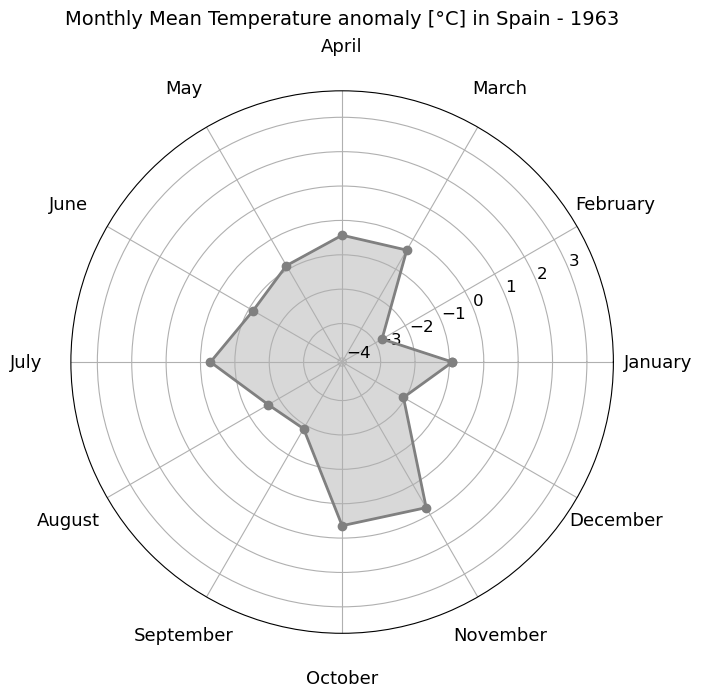

In [58]:
variable= "Monthly Total Precipitation anomaly"
place = "Spain"
set_place = 0

Charts_Monthly(place,place_name,data_monthly_spain,variable)

Monthly Total Precipitation anomaly in Spain

GIF created successfully: Monthly_anomaly/Spain/GIF/Monthly Total Precipitation anomaly/output.gif

*******************



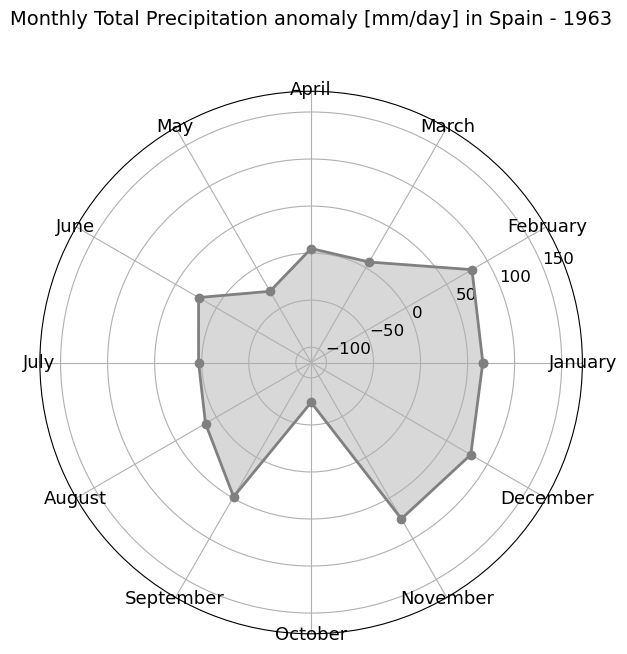

In [59]:
variable= "Monthly Maximum Wind Speed anomaly"
place = "Spain"
set_place = 0

Charts_Monthly(place,place_name,data_monthly_spain,variable)

Monthly Maximum Wind Speed anomaly in Spain

GIF created successfully: Monthly_anomaly/Spain/GIF/Monthly Maximum Wind Speed anomaly/output.gif

*******************



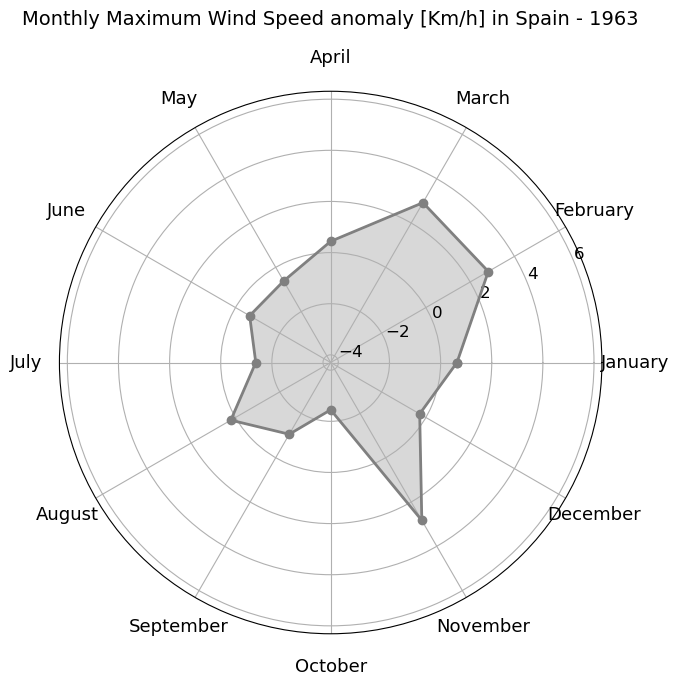

----------------------

#### Partial conclution

It is difficult to find a trend in precipitation and maximum wind speed from the animation. However, the monthly temperature anomaly animation reveals an expanding area of the polygon over time, which suggests a rise in temperatures. This increase in temperature could confirm the existence of climate change.

----------------------

<a name="item2.2.2"></a>
### 2.2.2. Bar and line chart monthly temperature anomaly

Bar graphs are used to represent monthly climate variables and detect trends over the years.

In [221]:
def Bar_Monthly(place,place_name,df_raw,variable):
    
    import matplotlib.pyplot as plt
    from PIL import Image
    import io

    #Determinate unit
    unit = Unit_variable(variable)
    
    variable_print=variable.split()
    variable_print = ' '.join(variable_print[1:-1])
    
    # Name of place to print
    if place == "Spain":

        df = df_raw[["Year","Month",variable]]
        place_print = f"{place}"

    else:

        df = df_raw[df_raw[place] == place_name][["Year","Month",variable]]
        place_print = f"{place_name} ({place})"

    # Get the list of unique months for the city
    unique_month = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"] 
    
    # Filter data for the specific month and place
    for num,month in enumerate (unique_month, start=1):
        
        #Historical average climate variable
        if place == "Spain":
            historical = df_raw[df_raw["Month"] == month][f"Historical monthly average {variable_print}"].iloc[0]

        else:
            historical = df_raw[(df_raw[place] == place_name) & (df_raw["Month"] == month)][f"Historical monthly average {variable_print}"].iloc[0]

        # Maximum and minimum values to create a color scale
        index_min = df[df["Month"] == month][variable].idxmin()
        min_value = df[df["Month"] == month].loc[index_min][["Year", variable]]

        index_max = df[df["Month"] == month][variable].idxmax()
        max_value = df[df["Month"] == month].loc[index_max][["Year", variable]]
        
        title_print = f"{variable} in {place_print} during {month} 1963-2022"

        # Configure matplotlib figure layout
        fig_line = px.line(data_frame=df[df["Month"] == month],
                     x="Year",
                     y=variable,
                     title=title_print)
        
        fig_line.update_layout(coloraxis_colorscale='Jet', yaxis_range=[min_value, max_value])
        
         # Add axis labels
        fig_line.update_xaxes(title_text='Year')  # Add x-axis label
        fig_line.update_yaxes(title_text=f"{variable} [{unit}]")  # Add y-axis label
        # Set color scale label to an empty string
        fig_line.update_coloraxes(colorbar_title='') 
        # Adjust the size of the graph
        fig_line.update_layout(
                            height=500,  # Specify the height in pixels
                            width=900)    # Specify the width in pixels
    
        fig_line.show()
        
        # Create bar chart
        fig_bar = px.bar(data_frame=df[(df["Month"] == month)],
                     x="Year",
                     y=variable,
                     color=variable,
                     range_color=[min_value[variable], max_value[variable]],  # Color scale limits
                     title=title_print)

        fig_bar.update_layout(coloraxis_colorscale='Jet')
        
        # Add axis labels
        fig_bar.update_xaxes(title_text='Year')  # Add x-axis label
        fig_bar.update_yaxes(title_text=f"{variable} [{unit}]")  # Add y-axis label
        # Set color scale label to an empty string
        fig_bar.update_coloraxes(colorbar_title='')  
        # Adjust the size of the graph
        fig_bar.update_layout(
                            height=500,  # Specify the height in pixels
                            width=900)    # Specify the width in pixels

        fig_bar.show()
        
        # Descriptive text
        print(f"In {month} {int(max_value['Year'])}, {place_print} experienced a record high {variable} of {max_value[variable]} {unit}, while {month} {int(min_value['Year'])} had a record low of only {min_value[variable]} {unit}.")
        print()
            
        #Save figure
        
        # Create a folder to save the charts if it does not exist
        if place == "Spain":
            
            output_folder_bar = f"Monthly_anomaly/{place}/bar/{variable}"
            output_folder_line = f"Monthly_anomaly/{place}/line/{variable}"
            
        else:
            
            output_folder_bar = f"Monthly_anomaly/{place}/{place_name}/bar/{variable}"
            output_folder_line = f"Monthly_anomaly/{place}/{place_name}/line/{variable}"
            
        if not os.path.exists(output_folder_line):
            os.makedirs(output_folder_line)
            
        if not os.path.exists(output_folder_bar):
            os.makedirs(output_folder_bar)

        path_bar = os.path.join(output_folder_bar, f"{num}_{month}.png")
        path_line = os.path.join(output_folder_line, f"{num}_{month}.png")
        
        # Save the graph
        fig_bar.write_image(path_bar)
        fig_line.write_image(path_line)
        
        print("--------------------")
        print()

In [222]:
# You can select the variable which you wish to analyze.
variable="Monthly Mean Temperature anomaly" # "Monthly Total Precipitation anomaly" or "Monthly Maximum Wind Speed anomaly"

# You can select the geographic area (Spain, Capital City or Autonomous Community) which you wish to analyze.
place = "Spain"

# If you chose capital or autonomous community, specify the areas to be analyzed in a list. Otherwise, enter a 0
# For example: ["Barcelona","Madrid"]
set_place = 0

if place == "Spain":

    Bar_Monthly(place,set_place,data_monthly_spain,variable)

elif place == "Autonomous Community":
    
    for place_name in set_place:

        Bar_Monthly(place,place_name,data_monthly_community,variable)

else:
    
    for place_name in set_place:

        Bar_Monthly(place,place_name,data_monthly_capital,variable)

In January 2016, Spain experienced a record high Monthly Mean Temperature anomaly of 2.36 °C, while January 1985 had a record low of only -2.27 °C.

--------------------



In February 2020, Spain experienced a record high Monthly Mean Temperature anomaly of 3.25 °C, while February 1963 had a record low of only -2.78 °C.

--------------------



In March 1997, Spain experienced a record high Monthly Mean Temperature anomaly of 3.0 °C, while March 1971 had a record low of only -3.38 °C.

--------------------



In April 2011, Spain experienced a record high Monthly Mean Temperature anomaly of 2.96 °C, while April 1986 had a record low of only -3.23 °C.

--------------------



In May 2022, Spain experienced a record high Monthly Mean Temperature anomaly of 3.19 °C, while May 1984 had a record low of only -4.12 °C.

--------------------



In June 2017, Spain experienced a record high Monthly Mean Temperature anomaly of 3.47 °C, while June 1978 had a record low of only -3.71 °C.

--------------------



In July 2022, Spain experienced a record high Monthly Mean Temperature anomaly of 3.16 °C, while July 1977 had a record low of only -3.46 °C.

--------------------



In August 2003, Spain experienced a record high Monthly Mean Temperature anomaly of 2.49 °C, while August 1977 had a record low of only -3.31 °C.

--------------------



In September 1987, Spain experienced a record high Monthly Mean Temperature anomaly of 2.47 °C, while September 1972 had a record low of only -3.41 °C.

--------------------



In October 2022, Spain experienced a record high Monthly Mean Temperature anomaly of 3.23 °C, while October 1974 had a record low of only -3.67 °C.

--------------------



In November 2022, Spain experienced a record high Monthly Mean Temperature anomaly of 2.25 °C, while November 1966 had a record low of only -2.95 °C.

--------------------



In December 2022, Spain experienced a record high Monthly Mean Temperature anomaly of 2.9 °C, while December 1970 had a record low of only -2.76 °C.

--------------------



In [224]:
variable= "Monthly Total Precipitation anomaly" 
place = "Spain"
set_place = 0

Bar_Monthly(place,set_place,data_monthly_spain,variable)

In January 1970, Spain experienced a record high Monthly Total Precipitation anomaly of 171.72 mm/day, while January 1983 had a record low of only -93.72 mm/day.

--------------------



In February 1966, Spain experienced a record high Monthly Total Precipitation anomaly of 119.29 mm/day, while February 1997 had a record low of only -85.12 mm/day.

--------------------



In March 2018, Spain experienced a record high Monthly Total Precipitation anomaly of 136.8 mm/day, while March 1997 had a record low of only -90.11 mm/day.

--------------------



In April 1971, Spain experienced a record high Monthly Total Precipitation anomaly of 103.63 mm/day, while April 1995 had a record low of only -74.66 mm/day.

--------------------



In May 1971, Spain experienced a record high Monthly Total Precipitation anomaly of 153.65 mm/day, while May 2015 had a record low of only -69.0 mm/day.

--------------------



In June 1988, Spain experienced a record high Monthly Total Precipitation anomaly of 103.02 mm/day, while June 2001 had a record low of only -47.83 mm/day.

--------------------



In July 1971, Spain experienced a record high Monthly Total Precipitation anomaly of 73.81 mm/day, while July 1975 had a record low of only -26.3 mm/day.

--------------------



In August 1983, Spain experienced a record high Monthly Total Precipitation anomaly of 73.2 mm/day, while August 2016 had a record low of only -30.74 mm/day.

--------------------



In September 1972, Spain experienced a record high Monthly Total Precipitation anomaly of 111.96 mm/day, while September 1985 had a record low of only -58.3 mm/day.

--------------------



In October 2003, Spain experienced a record high Monthly Total Precipitation anomaly of 109.5 mm/day, while October 1985 had a record low of only -76.8 mm/day.

--------------------



In November 1984, Spain experienced a record high Monthly Total Precipitation anomaly of 121.64 mm/day, while November 1981 had a record low of only -116.3 mm/day.

--------------------



In December 1996, Spain experienced a record high Monthly Total Precipitation anomaly of 154.7 mm/day, while December 1988 had a record low of only -88.76 mm/day.

--------------------



In [225]:
variable= "Monthly Maximum Wind Speed anomaly" 
place = "Spain"
set_place = 0

Bar_Monthly(place,set_place,data_monthly_spain,variable)

In January 2001, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 3.75 Km/h, while January 1993 had a record low of only -4.28 Km/h.

--------------------



In February 2014, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 4.79 Km/h, while February 1998 had a record low of only -3.62 Km/h.

--------------------



In March 2018, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 5.71 Km/h, while March 1997 had a record low of only -3.48 Km/h.

--------------------



In April 1998, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 3.97 Km/h, while April 2007 had a record low of only -2.56 Km/h.

--------------------



In May 1981, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 1.59 Km/h, while May 2000 had a record low of only -2.48 Km/h.

--------------------



In June 2012, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 1.53 Km/h, while June 1989 had a record low of only -1.98 Km/h.

--------------------



In July 2009, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 1.34 Km/h, while July 1992 had a record low of only -1.63 Km/h.

--------------------



In August 2007, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 1.65 Km/h, while August 1978 had a record low of only -1.5 Km/h.

--------------------



In September 1998, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 2.31 Km/h, while September 1977 had a record low of only -1.49 Km/h.

--------------------



In October 1993, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 3.53 Km/h, while October 1986 had a record low of only -2.48 Km/h.

--------------------



In November 2019, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 5.17 Km/h, while November 1981 had a record low of only -4.3 Km/h.

--------------------



In December 1981, Spain experienced a record high Monthly Maximum Wind Speed anomaly of 6.01 Km/h, while December 2016 had a record low of only -3.44 Km/h.

--------------------



<a name="item2.2.3"></a>
### 2.2.3. Highest anomaly for each month

The largest anomaly for each month is analyzed below. 

In [256]:
def max_monthly_anomaly (variables, df_raw, place, place_name):
    
    for variable in variables:
        
        variable_print=variable.split()
        variable_print = ' '.join(variable_print[1:-1])
        
        if place != "Spain":
            
            df = df_raw[df_raw[place]=="place_name"]
        
        df = df_raw.groupby(["Month"])[[variable]].idxmax().reset_index()
        
        for index,value in zip (df.index,list(df[variable].values)):
    
            df.loc[index,variable]= df_raw.loc[value,variable]
            df.loc[index,"Year"]= df_raw.loc[value,"Year"]
            df.loc[index,f"Historical monthly average {variable_print}"]= df_raw.loc[value,f"Historical monthly average {variable_print}"]
        
        df["Year"] = df["Year"].astype(int)
        
        if variable == "Monthly Mean Temperature anomaly":
            
            df_temperature = df.copy()
        
        elif variable == "Monthly Total Precipitation anomaly":
            df_precipitation = df.copy()
        
        else:
            df_wind = df.copy()
        
        #save datasets
        # Create a folder to save the charts if it does not exist
        output_folder = f"Monthly_anomaly/{place}/max_anomaly"
            
        if not os.path.exists(output_folder):
            os.makedirs(output_folder)
        
        output_filename = os.path.join(output_folder, f"{variable}.csv")

        df.to_csv(output_filename, decimal=',')
        
    return df_temperature,df_precipitation,df_wind

In [257]:
# You can select the geographic area (Spain, Capital City or Autonomous Community) which you wish to analyze.
place = "Spain"

# If you chose capital or autonomous community, specify the areas to be analyzed in a list. Otherwise, enter a 0
# For example: ["Barcelona","Madrid"]
set_place = 0

variables= ["Monthly Mean Temperature anomaly","Monthly Total Precipitation anomaly","Monthly Maximum Wind Speed anomaly"]

if place == "Spain":

    data_max_temp,data_max_prep,data_max_wind  = max_monthly_anomaly (variables, data_monthly_spain, place,set_place)

elif place == "Autonomous Community":
    
    for place_name in set_place:

        Bar_Monthly(place,place_name,data_monthly_community,variable)

else:
    
    for place_name in set_place:

        Bar_Monthly(place,place_name,data_monthly_capital,variable)

In [259]:
data_max_temp.head()

,Month,Monthly Mean Temperature anomaly,Year,Historical monthly average Mean Temperature
0,April,2.96,2011,11.17
1,August,2.49,2003,22.02
2,December,2.90,2022,6.81
3,February,3.25,2020,6.93
4,January,2.36,2016,6.00


In [260]:
data_max_prep.head()

,Month,Monthly Total Precipitation anomaly,Year,Historical monthly average Total Precipitation
0,April,103.63,1971,117.54
1,August,73.20,1983,49.49
2,December,154.70,1996,110.66
3,February,119.29,1966,103.79
4,January,171.72,1970,102.72


In [261]:
data_max_wind.head()

,Month,Monthly Maximum Wind Speed anomaly,Year,Historical monthly average Maximum Wind Speed
0,April,3.97,1998,17.00
1,August,1.65,2007,15.17
2,December,6.01,1981,15.57
3,February,4.79,2014,16.80
4,January,3.75,2001,15.79


----------------------

#### Partial conclution

All of the months showed a rising temperature trend over the years. However, the precipitation graphs did not exhibit a clear trend. In terms of maximum wind speed, only a few months, like June, July, and August, showed an increase.

----------------------


<a name="item3"></a>
# Conclution

First of all, I would like to emphasize that there are few free sources available for extracting historical climate data. After searching, I discovered the Open-Meteo API, which allowed me to achieve my first objective.

Secondly, both the values of the anomalies of the climatic variables and their diverse graphic representations and animation helped analyze changes in patterns and possible trends in them.

Finally, after finishing my studies in Spain, I found a strong trend of increasing air temperature, also known as global warming, and a slight trend of decreasing precipitation and increasing maximum wind speed.